# Preprocessing Notebook

This notebook handles the preprocessing of a dataset, including:
- Importing and inspecting the dataset
- Outlier detection and removal (both manually identified and via autoencoders, PCA, k-NN)
- Class distribution analysis
- Augmentation techniques to handle class imbalance
- Saving the cleaned and augmented dataset for further usage

In [2]:
import tensorflow as tf
from tensorflow import keras as tfk

import keras as tfkl


print(f"Tensorflow version -> {tf.__version__}")
print(f"Tensorflow keras version -> {tfk.__version__}")
print(f"Keras version -> {tfkl.__version__}")

Tensorflow version -> 2.16.1
Tensorflow keras version -> 3.3.3
Keras version -> 3.3.3


# Import Libraries

In [3]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Reshape
from tensorflow.keras.models import Model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import match_template
from skimage.transform import rotate
import random
import pandas as pd
from matplotlib.colors import ListedColormap, BoundaryNorm
from skimage.measure import label, regionprops
from skimage.util import view_as_windows
from skimage import morphology
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

In [4]:
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Load Data

#### Dataset Details

- **Image Size:** 64x128
- **Color Space:** Grayscale (1 channel)
- **Input Shape:** (64, 128)
- **File Format:** `.npz` (Numpy archive)
- **Number of Classes:** 5

#### Class Labels

- **0:** Background
- **1:** Soil
- **2:** Bedrock
- **3:** Sand
- **4:** Big Rock

In [5]:
# Load dataset from the kaggle input
dataset_address = "/kaggle/input/dataset/mars_for_students.npz"
data = np.load(dataset_address)
train, test = data['training_set'], data['test_set']
image_ratio = test.shape[1] / test.shape[2]

print(train.shape, test.shape)

(2615, 2, 64, 128) (10022, 64, 128)


## Exploring the Training Set
**Display Random Images with Labels** <br>
This function randomly selects a specified number of images and their corresponding labels from the training set and displays them in a grid. It helps in getting a quick visual understanding of the dataset.

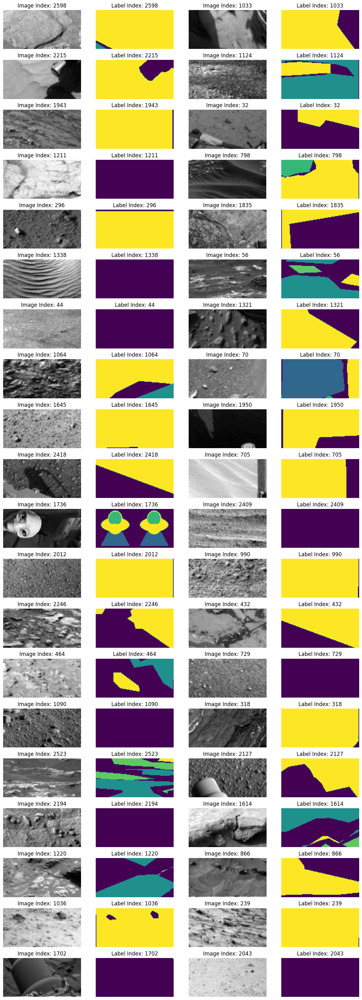

In [6]:
def display_random_images_with_labels(images, labels, rows, cols, image_ratio):
    import numpy as np
    import matplotlib.pyplot as plt
    
    random_indices = np.random.choice(len(images), rows * cols, replace=False)
    fig, axes = plt.subplots(rows, cols * 2, figsize=(12, rows * 1.6))
    axes = axes.flatten()
    
    for i, idx in enumerate(random_indices):
        image_index = i * 2
        label_index = i * 2 + 1
        
        # Display the image
        axes[image_index].imshow(images[idx], cmap='gray')
        axes[image_index].axis('off')
        axes[image_index].set_title(f"Image Index: {idx}")
        
        # Display the label
        axes[label_index].imshow(labels[idx])
        axes[label_index].axis('off')
        axes[label_index].set_title(f"Label Index: {idx}")
    
    plt.tight_layout()
    plt.show()

display_random_images_with_labels(train[:, 0], train[:, 1], 20, 2, image_ratio)

It seems that we have outliers in training set! Alien images!

# Outlier Detection

Displays a specific image and its label based on the provided index. It helps in identifying and verifying outliers manually.

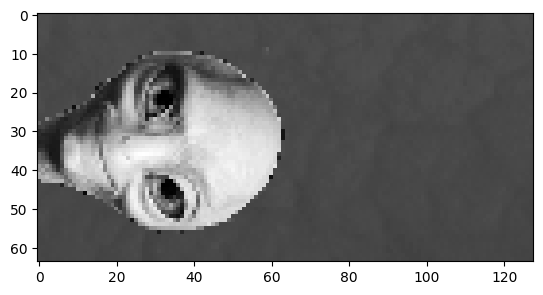

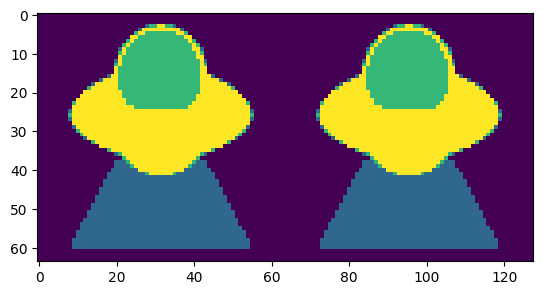

In [7]:
 def display_image_and_label(data, index):
    plt.imshow(data[index, 0], cmap='gray')
    plt.figure()
    plt.imshow(data[index, 1])

display_image_and_label(train, 863)

## Remove Alien Outliers Using Template Matching

This section focuses on identifying and removing outlier images that resemble aliens using template matching. It generates augmented versions of a known alien image, computes the Intersection over Union (IoU) with other images, and removes those that exceed a specified IoU threshold.

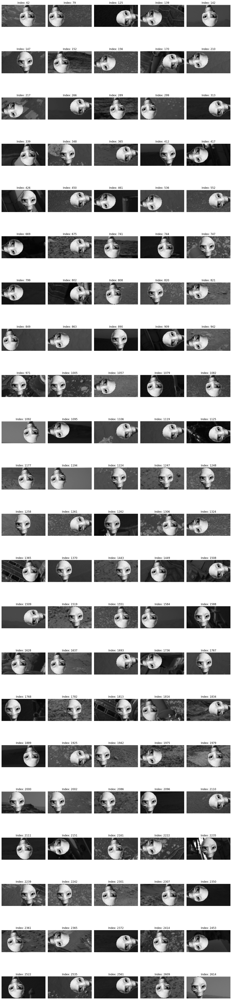

Removed 110 outliers: [62, 79, 125, 139, 142, 147, 152, 156, 170, 210, 217, 266, 289, 299, 313, 339, 348, 365, 412, 417, 426, 450, 461, 536, 552, 669, 675, 741, 744, 747, 799, 802, 808, 820, 821, 849, 863, 890, 909, 942, 971, 1005, 1057, 1079, 1082, 1092, 1095, 1106, 1119, 1125, 1177, 1194, 1224, 1247, 1248, 1258, 1261, 1262, 1306, 1324, 1365, 1370, 1443, 1449, 1508, 1509, 1519, 1551, 1584, 1588, 1628, 1637, 1693, 1736, 1767, 1768, 1782, 1813, 1816, 1834, 1889, 1925, 1942, 1975, 1979, 2000, 2002, 2086, 2096, 2110, 2111, 2151, 2161, 2222, 2235, 2239, 2242, 2301, 2307, 2350, 2361, 2365, 2372, 2414, 2453, 2522, 2535, 2561, 2609, 2614]


In [8]:
def generate_augmented_templates(template, angles=[0, 90, 180, 270]):
    augmented_templates = [template]
    # Generate rotated templates
    for angle in angles:
        augmented_templates.append(rotate(template, angle, resize=False))
    # Generate flipped templates
    augmented_templates.append(np.flipud(template))
    augmented_templates.append(np.fliplr(template))
    return augmented_templates

def compute_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    if union == 0:
        return 0
    else:
        return intersection / union

def display_and_remove_alien_outliers(dataset, alien_index, threshold=0.8):
    alien_label = dataset[alien_index, 1]
    
    # Generate augmented templates of the alien label
    augmented_templates = generate_augmented_templates(alien_label)
    
    to_remove = []
    outliers = []
    
    for i in range(dataset.shape[0]):
        current_label = dataset[i, 1]
        match_found = False
        for template in augmented_templates:
            iou = compute_iou(current_label, template)
            if iou > threshold:
                match_found = True
                break
    
        if match_found:
            to_remove.append(i)
            outliers.append((i, dataset[i, 0]))
    
    n_outliers = len(outliers)
    cols = 5
    rows = (n_outliers + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
    axes = axes.flatten()
    
    for ax, (index, image) in zip(axes, outliers):
        ax.imshow(image, cmap='gray')
        ax.set_title(f"Index: {index}")
        ax.axis('off')
    
    for ax in axes[len(outliers):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    cleaned_dataset = np.delete(dataset, to_remove, axis=0)
    return cleaned_dataset, to_remove

alien_index = 863
cleaned_data, removed_indices = display_and_remove_alien_outliers(train, alien_index)
print(f"Removed {len(removed_indices)} outliers: {removed_indices}")

In [9]:
print(cleaned_data.shape)

(2505, 2, 64, 128)


## Further Outlier Detection Using Autoencoder
To make sure that there is no more outliers!

### Prepare Data for the Autoencoder

Here, the images are normalized to have pixel values between 0 and 1 and reshaped to include a channel dimension, which is required for convolutional neural networks.

In [10]:
training_images = cleaned_data[:, 0]
training_labels = cleaned_data[:, 1]

# Normalize images to [0, 1] and reshape to (64, 128, 1) for grayscale channels
training_images = training_images / 255.0
training_images = training_images.reshape((-1, 64, 128, 1))

### Define and Train the Convolutional Autoencoder

This section defines a convolutional autoencoder, compiles it with the Mean Squared Error (MSE) loss function, and trains it on the preprocessed training images. Callbacks such as early stopping and learning rate reduction are used to optimize the training process and prevent overfitting.

Epoch 1/100


I0000 00:00:1734182321.639331      95 service.cc:145] XLA service 0x7e96080288f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734182321.639384      95 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734182321.639388      95 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 6/36 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0628

I0000 00:00:1734182327.481888      95 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.0355 - val_loss: 0.0031 - learning_rate: 0.0010
Epoch 2/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0028 - val_loss: 0.0018 - learning_rate: 0.0010
Epoch 3/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0019 - val_loss: 0.0015 - learning_rate: 0.0010
Epoch 4/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0016 - val_loss: 0.0014 - learning_rate: 0.0010
Epoch 5/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0015 - val_loss: 0.0014 - learning_rate: 0.0010
Epoch 6/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0014 - val_loss: 0.0012 - learning_rate: 0.0010
Epoch 7/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0013 - val_loss: 0.0011 - learning_rate: 0.0010
Epoch 8/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0012 - val_loss: 0.0010 - learning_rate: 0.0010
Epoch 9/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0011 - val_loss: 0.0010 - learning_rate: 0.0010
Epoch 10/100
36/36 ━

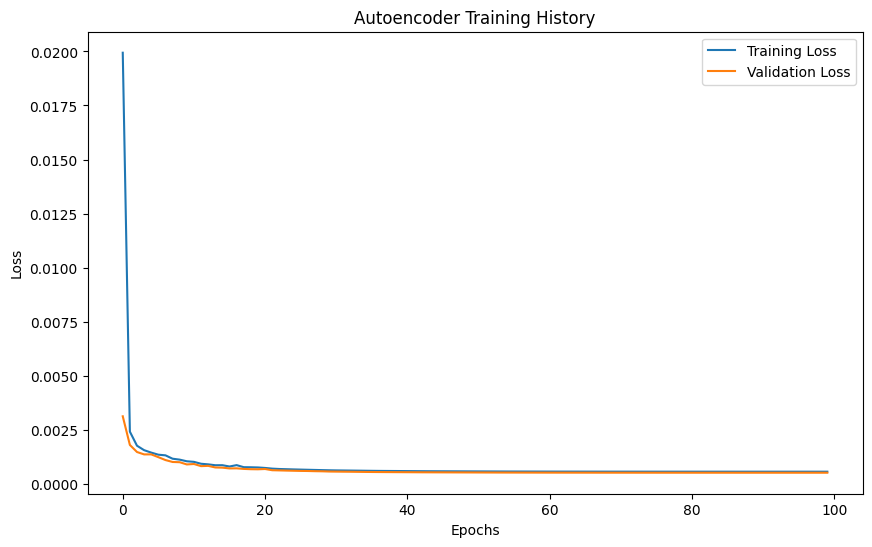

In [11]:
# Define the convolutional autoencoder architecture
input_shape = (64, 128, 1)
input_layer = Input(shape=input_shape)

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)  # Latent space

# Decoder
x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)  # Output layer

autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,  # Stop training if val_loss doesn't improve for 10 epochs
    restore_best_weights=True,  # Restore the weights of the best epoch
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,  # Reduce learning rate by half
    patience=7,  # Reduce LR if val_loss doesn't improve for 5 epochs
    min_lr=1e-6,  # Minimum learning rate
    verbose=1
)

# Train the autoencoder with callbacks
history = autoencoder.fit(
    training_images, training_images,
    epochs=100,  # Maximum number of epochs
    batch_size=64,
    shuffle=True,
    validation_split=0.1,
    callbacks=[early_stopping, reduce_lr]
)

# Plot Training History
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Autoencoder Training History')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Predicting

After training the autoencoder, this section computes the reconstruction error for each training image. Images with errors above the 95th percentile are considered outliers. This helps in identifying anomalies that the autoencoder couldn't reconstruct well.

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step


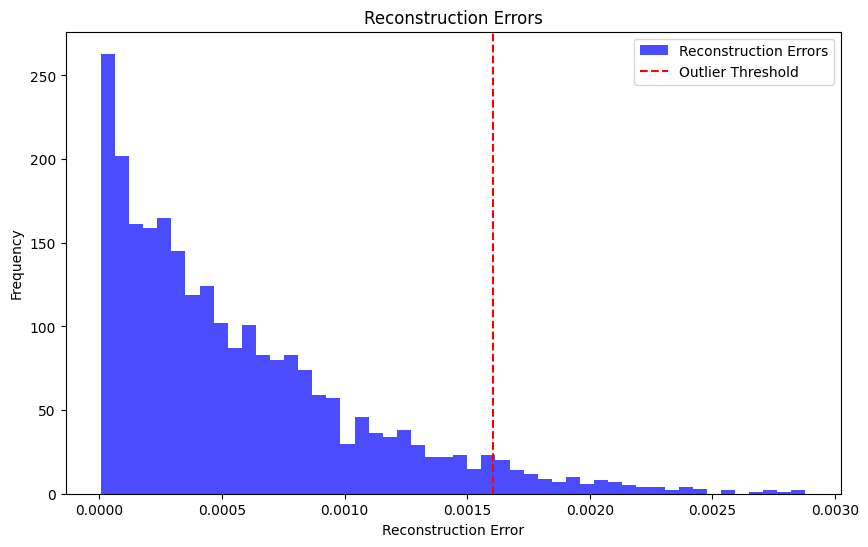

number of outliers: 126


In [12]:
# Compute reconstruction errors
reconstructions = autoencoder.predict(training_images)
reconstruction_errors = np.mean((training_images - reconstructions) ** 2, axis=(1, 2, 3))

# Set a threshold for identifying outliers
threshold = np.percentile(reconstruction_errors, 95)  # 95th percentile as threshold
outliers = np.where(reconstruction_errors > threshold)[0]  # Index of outliers

# Visualize reconstruction errors
plt.figure(figsize=(10, 6))
plt.hist(reconstruction_errors, bins=50, alpha=0.7, color='blue', label='Reconstruction Errors')
plt.axvline(threshold, color='red', linestyle='--', label='Outlier Threshold')
plt.title('Reconstruction Errors')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()
print('number of outliers:', len(outliers))

### Display results

This function displays all the detected outlier images along with their indices. Visual inspection can help verify whether these outliers are indeed anomalies or require further processing.

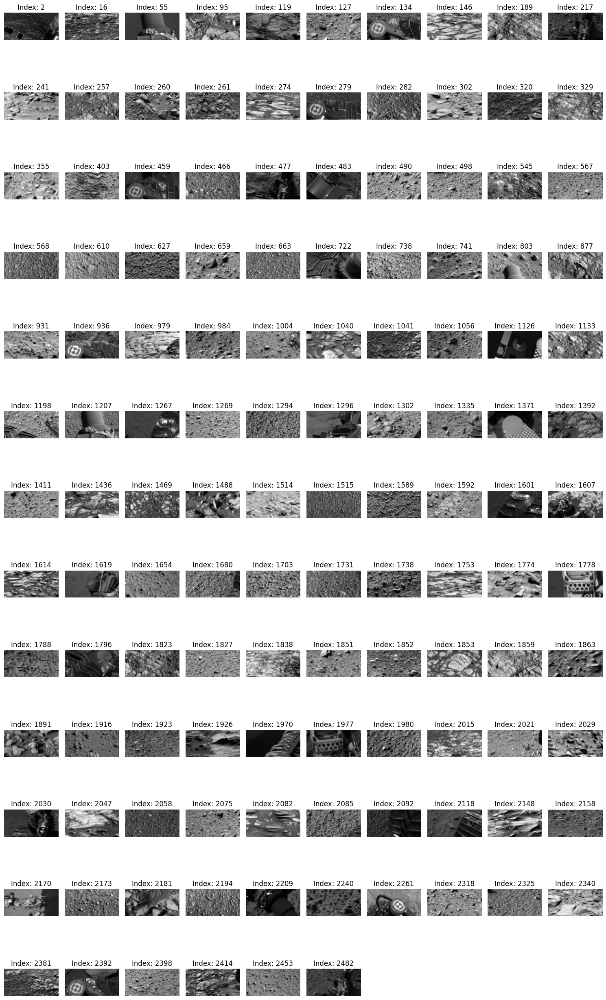

outliers are: [   2   16   55   95  119  127  134  146  189  217  241  257  260  261
  274  279  282  302  320  329  355  403  459  466  477  483  490  498
  545  567  568  610  627  659  663  722  738  741  803  877  931  936
  979  984 1004 1040 1041 1056 1126 1133 1198 1207 1267 1269 1294 1296
 1302 1335 1371 1392 1411 1436 1469 1488 1514 1515 1589 1592 1601 1607
 1614 1619 1654 1680 1703 1731 1738 1753 1774 1778 1788 1796 1823 1827
 1838 1851 1852 1853 1859 1863 1891 1916 1923 1926 1970 1977 1980 2015
 2021 2029 2030 2047 2058 2075 2082 2085 2092 2118 2148 2158 2170 2173
 2181 2194 2209 2240 2261 2318 2325 2340 2381 2392 2398 2414 2453 2482]


In [13]:
def display_all_outliers_with_indices(images, outlier_indices, max_columns=10):
    num_outliers = len(outlier_indices)
    num_columns = min(max_columns, num_outliers)
    num_rows = (num_outliers + num_columns - 1) // num_columns  # Calculate the number of rows
    
    plt.figure(figsize=(15, num_rows * 2))
    for i, idx in enumerate(outlier_indices):
        plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(images[idx].reshape(64, 128), cmap='gray')
        plt.axis('off')
        plt.title(f"Index: {idx}")
    
    plt.tight_layout()
    plt.show()

# Call the function to display all outliers with indices
display_all_outliers_with_indices(training_images, outliers)
print('outliers are:' ,outliers)

Observation: No additional outliers detected beyond aliens.

## Prepare Cleaned Data for Further Processing

In [14]:
cleaned_training_images = cleaned_data[:, 0].copy()
cleaned_training_labels = cleaned_data[:, 1].copy()
cleaned_training_images.shape, cleaned_training_labels.shape

((2505, 64, 128), (2505, 64, 128))

## Outlier Detection using PCA & KNN
This section employs Principal Component Analysis (PCA) for dimensionality reduction followed by k-Nearest Neighbors (k-NN) to identify outliers based on their average distance to their neighbors. Visualizing these outliers helps in understanding the nature of anomalies present in the data.

In [15]:
def detect_outliers(images, top_percent=1):

    def flatten_images(images):
        flattened = [img.flatten() for img in images]
        return np.array(flattened)
    
    # Flatten the images
    flattened_images = flatten_images(images)
    
    # Step 2: Dimensionality reduction using PCA
    pca = PCA(n_components=50)  # Reduce to 50 principal components
    pca_features = pca.fit_transform(flattened_images)
    
    # Step 3: k-NN based outlier detection
    k = 150  # Number of neighbors
    nbrs = NearestNeighbors(n_neighbors=k).fit(pca_features)
    distances, _ = nbrs.kneighbors(pca_features)
    
    # Calculate the average distance to k neighbors
    avg_distances = distances.mean(axis=1)
    
    # Identify outliers: points with distance above a threshold
    threshold = np.percentile(avg_distances, 100 - top_percent)  # Top 5% considered outliers
    outliers = np.where(avg_distances > threshold)[0]
    
    # Step 4: Visualization
    plt.scatter(pca_features[:, 0], pca_features[:, 1], c='blue', s=5, label='Normal')
    plt.scatter(pca_features[outliers, 0], pca_features[outliers, 1], c='red', s=10, label='Outliers')
    plt.title('Outlier Detection using k-NN Distances')
    plt.legend()
    plt.show()
    
    return outliers

#### Detect for top 10 and 5 percent 

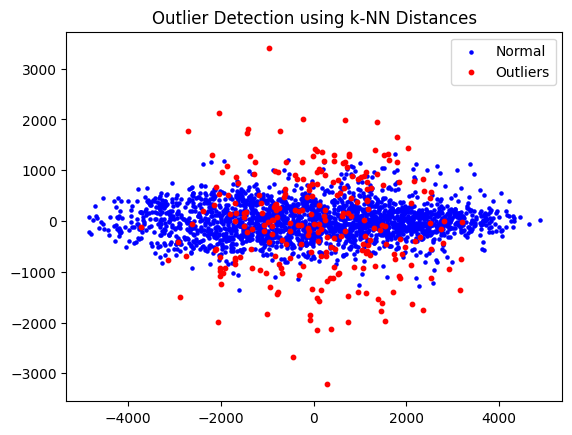

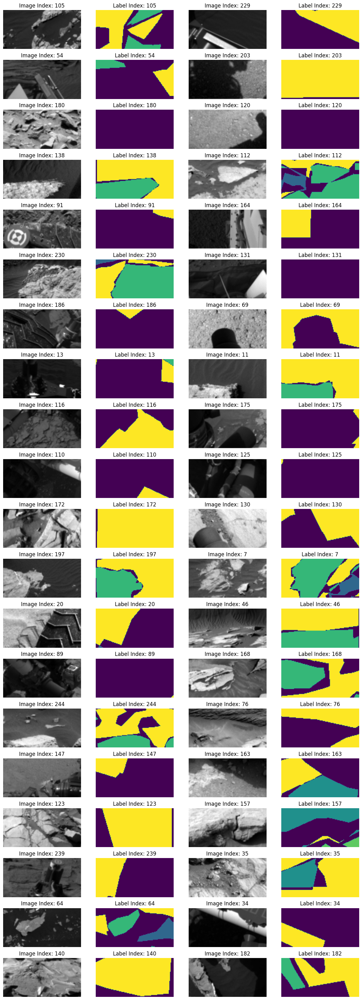

In [16]:
x_outliers = detect_outliers(cleaned_data[:, 0], top_percent=10)
display_random_images_with_labels(cleaned_data[:, 0][x_outliers], cleaned_data[:, 1][x_outliers], 20, 2, image_ratio)

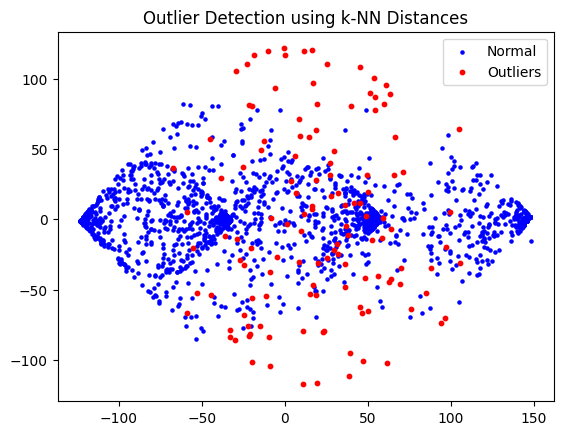

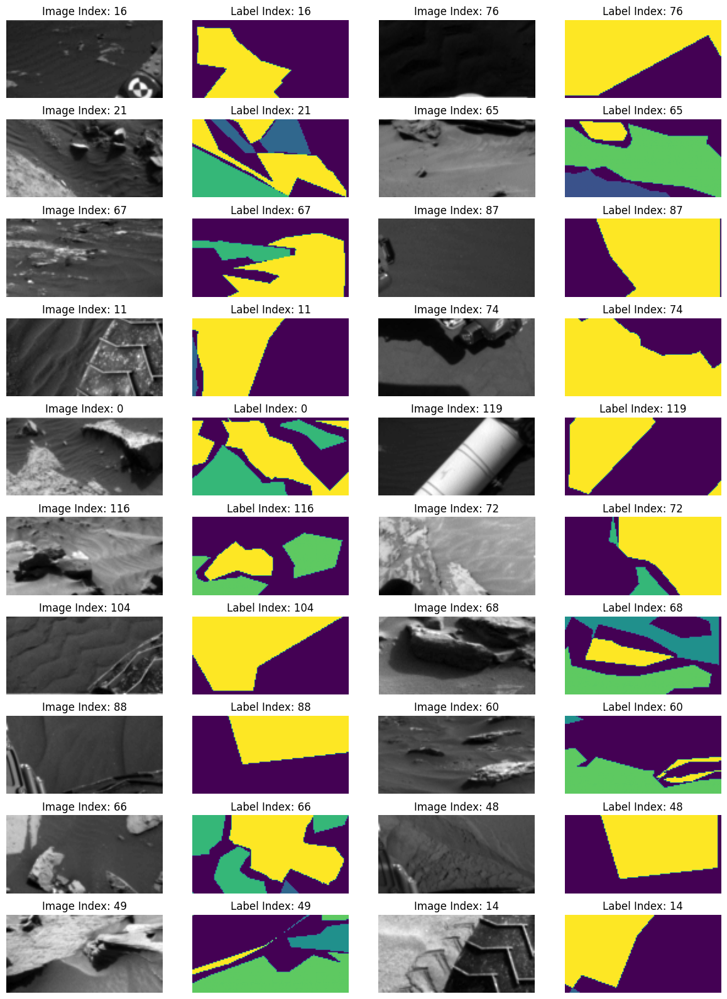

In [17]:
y_outliers = detect_outliers(cleaned_data[:, 1], top_percent=5)
display_random_images_with_labels(cleaned_data[:, 0][y_outliers], cleaned_data[:, 1][y_outliers], 10, 2, image_ratio)

## Checking Outliers in Testset

Similar to the training data, test images are normalized and reshaped to include the channel dimension for consistency in processing.

In [18]:
test_images = test
test_images = test_images / 255.0
test_images = test_images.reshape((-1, 64, 128, 1))

### Compute Reconstruction Errors on Test Set
Reconstruction errors for the test set are computed using the trained autoencoder. A higher threshold (99th percentile) is used to identify outliers, which are then visualized to assess their nature.

314/314 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


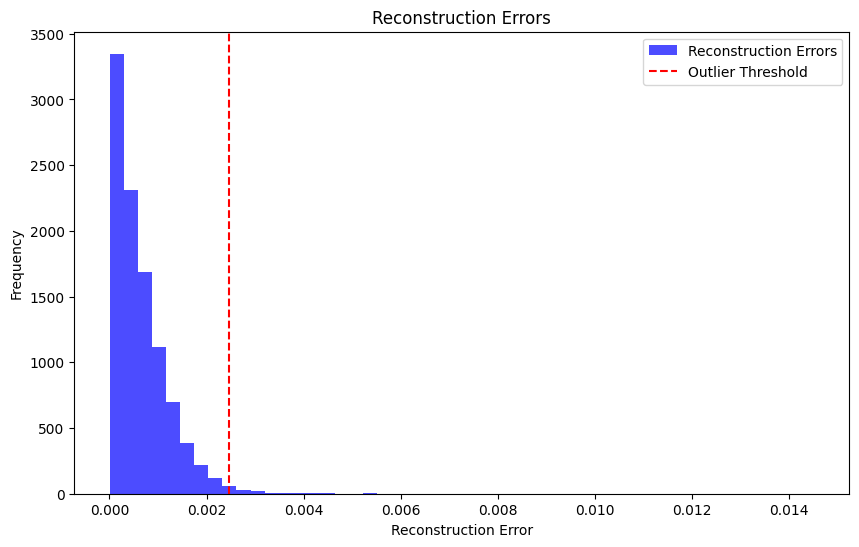

number of outliers: 101


In [19]:
# Compute reconstruction errors
reconstructions = autoencoder.predict(test_images)
reconstruction_errors = np.mean((test_images - reconstructions) ** 2, axis=(1, 2, 3))

# Set a threshold for identifying outliers
threshold = np.percentile(reconstruction_errors, 99)  # 95th percentile as threshold
outliers = np.where(reconstruction_errors > threshold)[0]  # Index of outliers

# Visualize reconstruction errors
plt.figure(figsize=(10, 6))
plt.hist(reconstruction_errors, bins=50, alpha=0.7, color='blue', label='Reconstruction Errors')
plt.axvline(threshold, color='red', linestyle='--', label='Outlier Threshold')
plt.title('Reconstruction Errors')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()
print('number of outliers:', len(outliers))

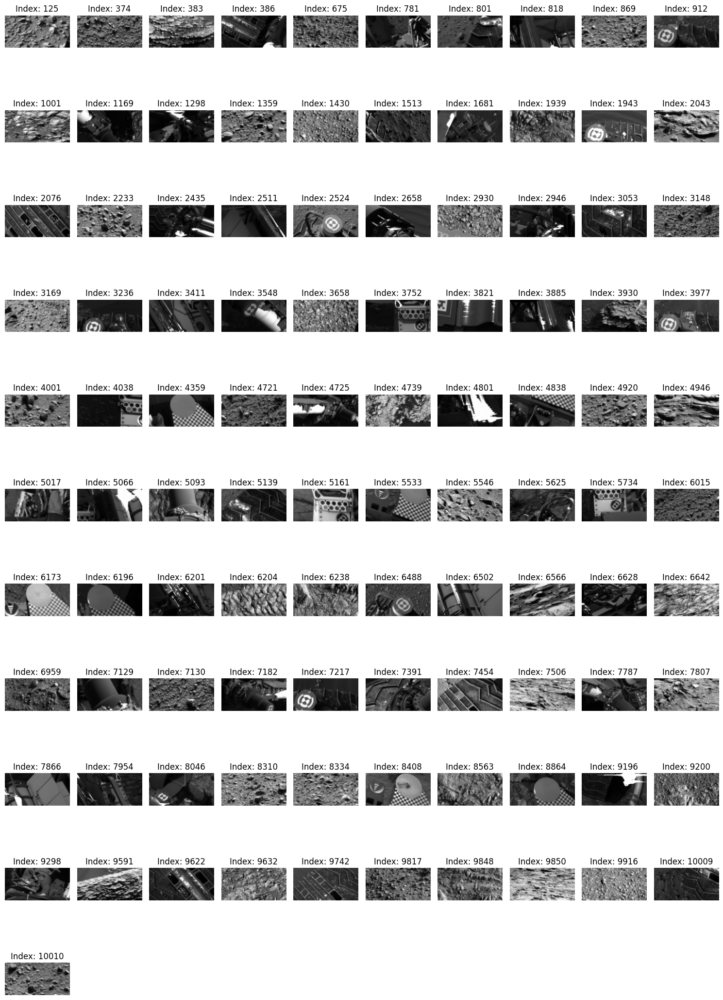

In [20]:
display_all_outliers_with_indices(test_images, outliers)

# Check Class distribution

This function computes and visualizes the distribution of different classes within the dataset. It highlights any class imbalance issues, which are crucial for informing data augmentation and model training strategies.

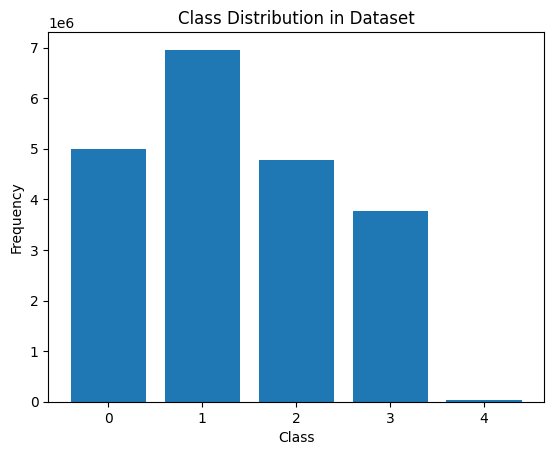

Class Distribution:  [4988826, 6957538, 4776810, 3770823, 26963]
cleaned training images and labels shape:  (2505, 64, 128) (2505, 64, 128)


In [21]:
def class_distribution(data_labels):
    def calculate_class_distribution(labels):
        flattened_labels = labels.flatten()
        class_counts = [np.sum(flattened_labels == i) for i in range(5)]  # 5 classes (0-4)
        return class_counts
    
    class_distribution = calculate_class_distribution(data_labels)
    
    # Plot the class distribution for visualization
    plt.bar(range(5), class_distribution)
    plt.xlabel('Class')
    plt.ylabel('Frequency')
    plt.title('Class Distribution in Dataset')
    plt.show()
    
    print("Class Distribution: ", class_distribution)

class_distribution(cleaned_training_labels)
print("cleaned training images and labels shape: ",cleaned_training_images.shape, cleaned_training_labels.shape)

As we can see class 4 is so rare in the dataset! we have to handle this problem somehow!

## Class 4 Visualization

This function filters and displays images that contain a specific target class (in this case, Class 4: Big Rock). It helps in understanding how underrepresented classes appear in the dataset.

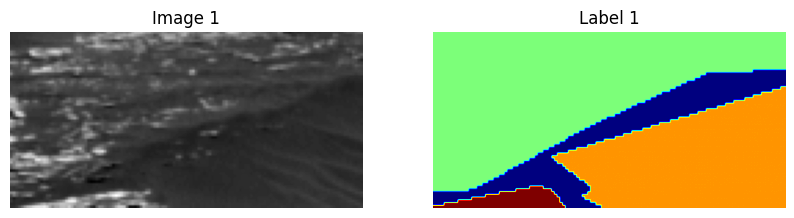

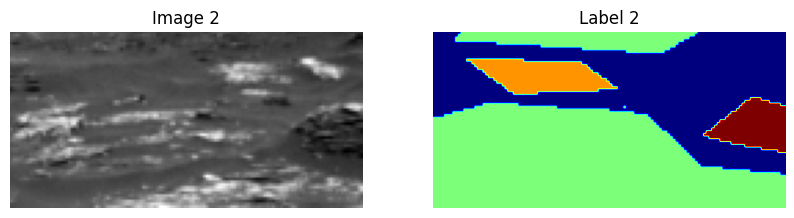

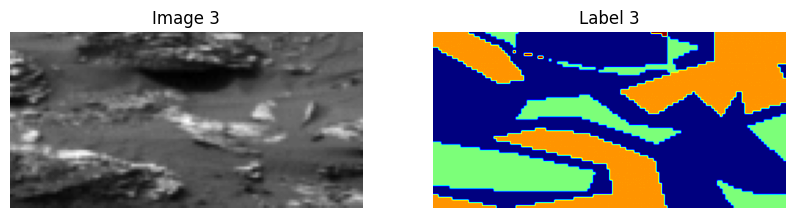

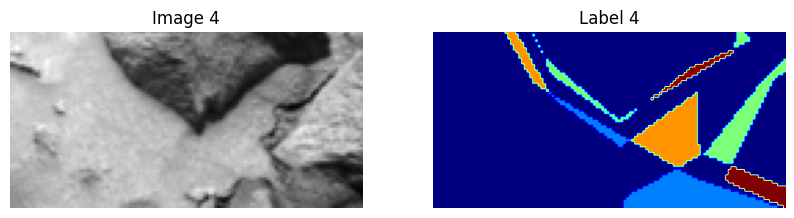

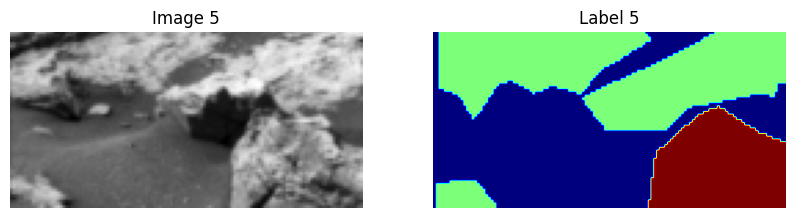

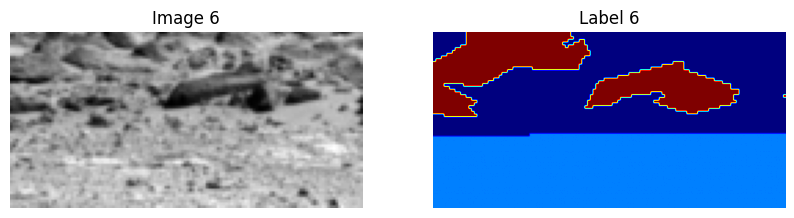

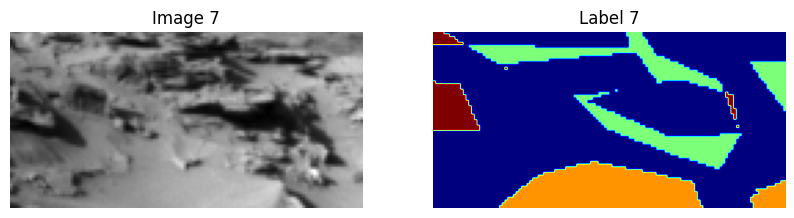

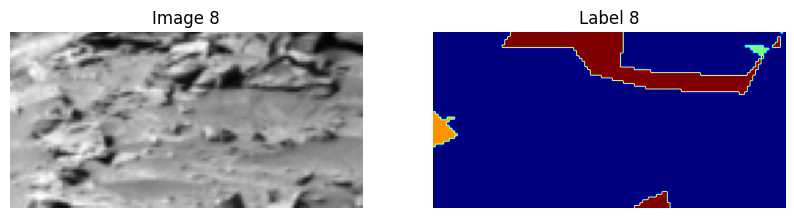

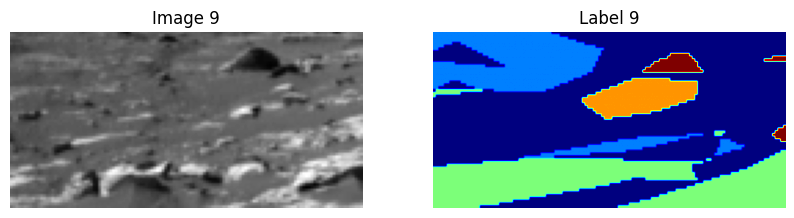

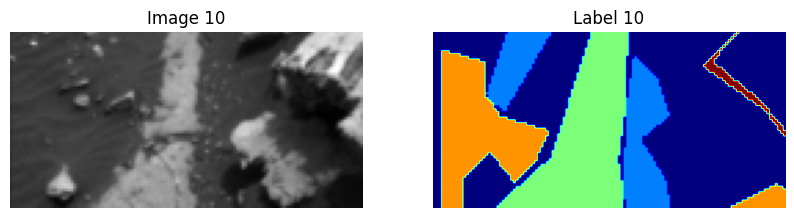

In [22]:
def display_images_with_specific_class(images, labels, target_class, num_to_display):
    indices = [i for i in range(labels.shape[0]) if target_class in np.unique(labels[i])]
    selected_indices = indices[:num_to_display]
    for i, idx in enumerate(selected_indices):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Image {i+1}")
        plt.imshow(images[idx], cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Label {i+1}")
        plt.imshow(labels[idx], cmap='jet')
        plt.axis('off')
        plt.show()

display_images_with_specific_class(cleaned_training_images, cleaned_training_labels, 4, 10)


# Augmentation

## Correlation Analysis Between Classes

This section analyzes the correlation between different classes within the dataset. Understanding these correlations can inform more strategic data augmentation techniques, especially when dealing with class imbalances.

In [23]:
labels = cleaned_training_labels
num_images = labels.shape[0]
num_classes = 5  # classes 0 through 4

# Initialize an array to hold class counts per image
class_counts_per_image = np.zeros((num_images, num_classes), dtype=np.int64)

# Count the number of pixels of each class in each image
for i in range(num_images):
    for c in range(num_classes):
        class_counts_per_image[i, c] = np.sum(labels[i] == c)

# Convert to a DataFrame for easier correlation computation and readability
df = pd.DataFrame(
    class_counts_per_image, 
    columns=[f"Class_{c}" for c in range(num_classes)]
)

# Compute correlation matrix
corr_matrix = df.corr(method='pearson')

print("Correlation matrix between class distributions:")
print(corr_matrix)

# If you want to specifically see correlation between class 4 and others:
print("\nCorrelation of Class_4 with other classes:")
print(corr_matrix['Class_4'])

Correlation matrix between class distributions:
          Class_0   Class_1   Class_2   Class_3   Class_4
Class_0  1.000000 -0.389256 -0.209893 -0.208132  0.054100
Class_1 -0.389256  1.000000 -0.471956 -0.415289 -0.054583
Class_2 -0.209893 -0.471956  1.000000 -0.261179 -0.039935
Class_3 -0.208132 -0.415289 -0.261179  1.000000  0.021203
Class_4  0.054100 -0.054583 -0.039935  0.021203  1.000000

Correlation of Class_4 with other classes:
Class_0    0.054100
Class_1   -0.054583
Class_2   -0.039935
Class_3    0.021203
Class_4    1.000000
Name: Class_4, dtype: float64


As you can see there is no meaningfull corrolation between class 4 and other classes. So we will try to augment it randomly.

## Adding patches of class 4 to other images
We are taking the whole rectangle around the objects to have a more meaningful representation of Big Rocks!

Extracting patches containing class 4 with at least 100 pixels...
Total patches extracted: 50
Starting augmentation...
Augmentation completed. Total images after augmentation: 2505


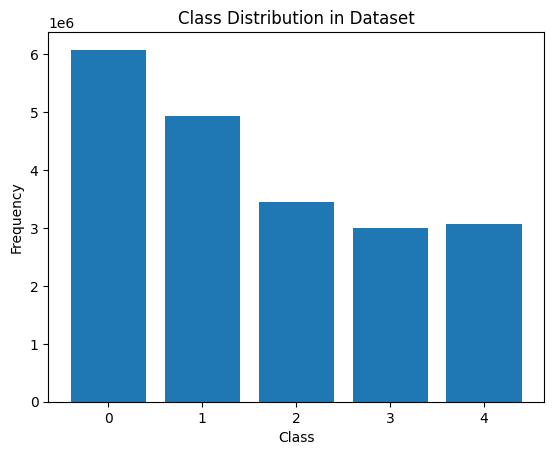

Class Distribution:  [6076345, 4928392, 3448189, 3005521, 3062513]
cleaned training images and labels shape:  (2505, 64, 128) (2505, 64, 128)


In [24]:
import numpy as np
import random
from skimage.measure import label, regionprops

def augment_class4(cleaned_training_images, cleaned_training_labels, class_idx, num_aug, max_attempts, min_pixels):
    patches = []
    num_images = cleaned_training_labels.shape[0]
    
    print(f"Extracting patches containing class {class_idx} with at least {min_pixels} pixels...")
    for i in range(num_images):
        label_img = cleaned_training_labels[i]
        class_mask = (label_img == class_idx)
        
        # Label connected regions
        labeled_regions = label(class_mask, connectivity=1)
        regions = regionprops(labeled_regions)
        
        for region in regions:
            if region.area < min_pixels:
                continue  # Skip small regions
            
            min_row, min_col, max_row, max_col = region.bbox
            patch_image = cleaned_training_images[i, min_row:max_row, min_col:max_col].copy()
            patch_label = label_img[min_row:max_row, min_col:max_col].copy()
            patches.append((patch_image, patch_label))
    
    if not patches:
        print(f"No regions found for class {class_idx} with at least {min_pixels} pixels. No augmentation performed.")
        return cleaned_training_images, cleaned_training_labels
    
    print(f"Total patches extracted: {len(patches)}")
    
    # Convert images and labels to lists for easier manipulation
    augmented_images = list(cleaned_training_images)
    augmented_labels = list(cleaned_training_labels)
    
    print("Starting augmentation...")
    for aug_num in range(num_aug):
        # Randomly select a patch
        patch_img, patch_lbl = random.choice(patches)
        patch_h, patch_w = patch_lbl.shape
        
        # Randomly select a target image
        target_idx = random.randint(0, num_images - 1)
        target_label = augmented_labels[target_idx]
        target_image = augmented_images[target_idx]
        target_h, target_w = target_label.shape
        
        # Determine possible top-left positions
        if patch_h > target_h or patch_w > target_w:
            continue
        
        # Attempt to find a valid location
        for attempt in range(max_attempts):
            top = random.randint(0, target_h - patch_h)
            left = random.randint(0, target_w - patch_w)
            
            # Check if the target region has any class_idx pixels
            target_region = target_label[top:top + patch_h, left:left + patch_w]
            if np.any(target_region == class_idx):
                continue
            
            # Paste the patch into the image and label
            augmented_images[target_idx][top:top + patch_h, left:left + patch_w] = patch_img
            augmented_labels[target_idx][top:top + patch_h, left:left + patch_w] = patch_lbl
            break
        else:
            continue
    
    print(f"Augmentation completed. Total images after augmentation: {len(augmented_images)}")
    
    # Convert lists back to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_labels = np.array(augmented_labels)
    
    return augmented_images, augmented_labels

# Example usage:
new_images, new_labels = augment_class4(
    cleaned_training_images.copy(), 
    cleaned_training_labels.copy(), 
    class_idx=4, 
    num_aug=8000, 
    max_attempts=1000, 
    min_pixels=100
)


class_distribution(new_labels)
print("cleaned training images and labels shape: ",new_images.shape, new_labels.shape)

As it can be seen classes are not extremely unbalanced anymore! This amount of unbalancy will be handled in training phase later.

## Display few images that include class 4 after augmentation

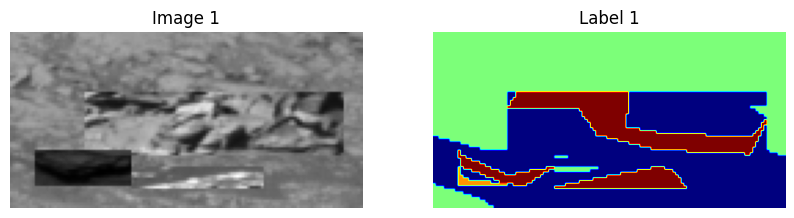

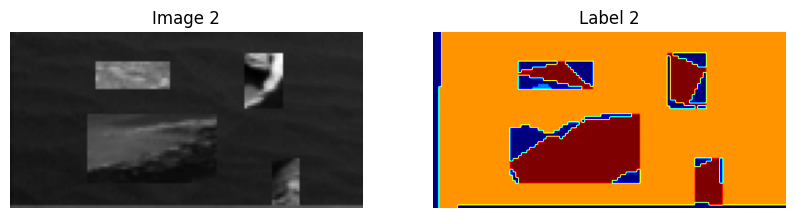

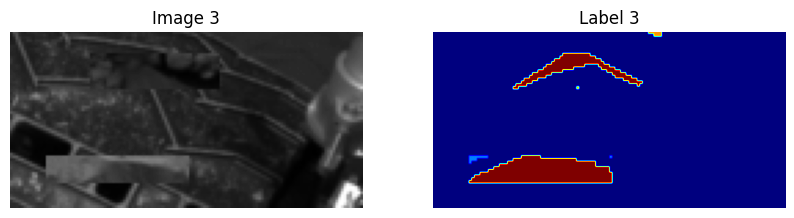

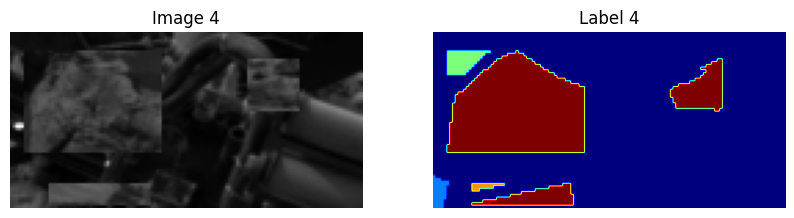

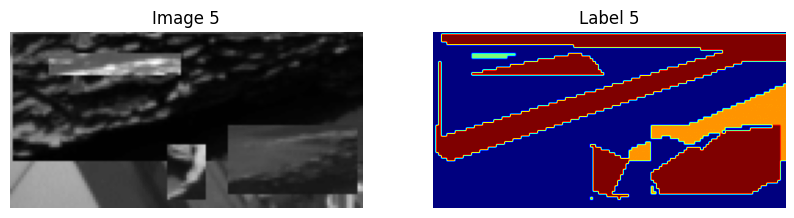

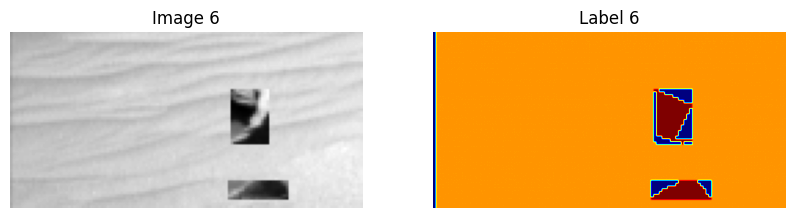

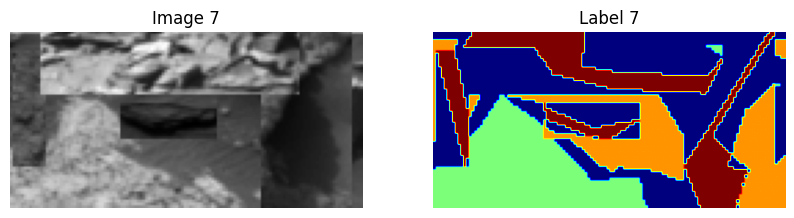

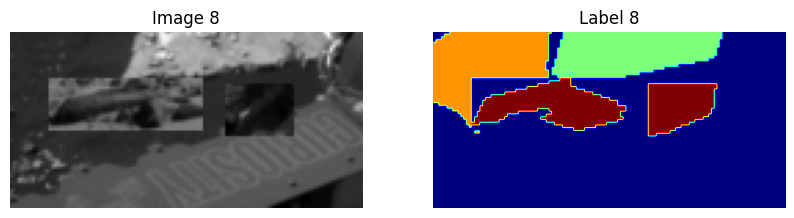

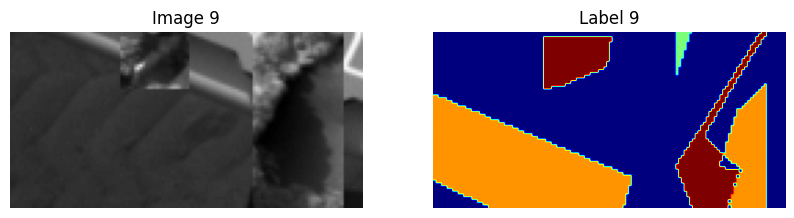

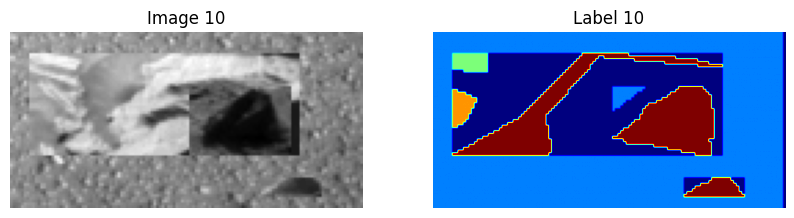

In [25]:
display_images_with_specific_class(new_images, new_labels, 4, 10)

# Save the Preprocessed dataset

In [26]:
Final_images = new_images
Final_labels = new_labels

print(f"Final images shape: {Final_images.shape}")
print(f"Final labels shape: {Final_labels.shape}")

np.savez("cleaned_training_set.npz", images=Final_images.astype(np.uint8), labels=Final_labels.astype(np.uint8))

print(f"Original dataset size: {train.shape[0]}")
print(f"Cleaned dataset size: {Final_images.shape[0]}")

Final images shape: (2505, 64, 128)
Final labels shape: (2505, 64, 128)
Original dataset size: 2615
Cleaned dataset size: 2505
